In [1]:
import ase.io
from ase.io.trajectory import Trajectory
from ase.io import extxyz
from ase.calculators.emt import EMT
from ase.build import fcc100, add_adsorbate, molecule
from ase.constraints import FixAtoms
from ase.visualize.plot import plot_atoms
from ase import Atoms
import matplotlib
import matplotlib.pyplot as plt
import os
import numpy as np
import util_funcs
from torch_geometric.utils import to_networkx, from_networkx, degree
import torch
from torch_geometric.data import Data

In [2]:
matplotlib.use('Agg')

%matplotlib inline

params = {
   'axes.labelsize': 14,
   'font.size': 14,
   'font.family': ' DejaVu Sans',
   'legend.fontsize': 20,
   'xtick.labelsize': 20,
   'ytick.labelsize': 20,
   'axes.labelsize': 25,
   'axes.titlesize': 25,
   'text.usetex': False,
   'figure.figsize': [12, 12]
}
matplotlib.rcParams.update(params)

# Reading trajectory

In [3]:
f_loc = os.getcwd() + "/s2ef_train_200K/0.extxyz"
traj = ase.io.read(f_loc, index=":")

## Visualisation
## -  Atom object

In [4]:
i = 200
tra = traj[i]

K8Sb16Se32C2O


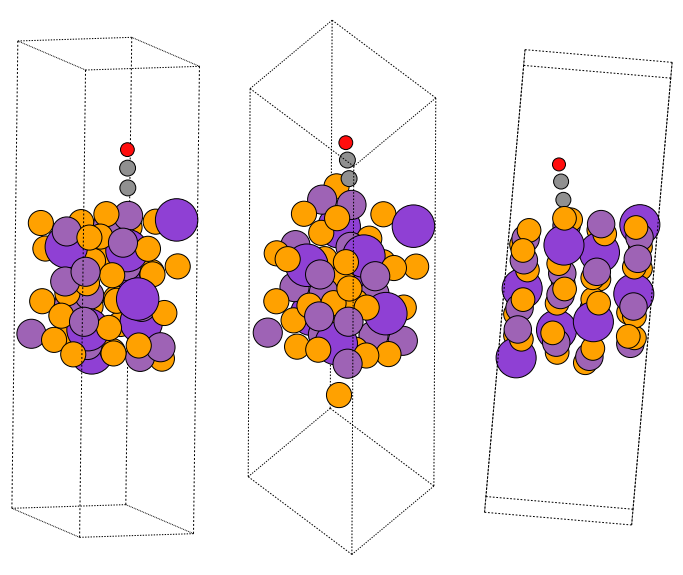

In [5]:
fig, ax = plt.subplots(1, 3)
for i in range(3):
    ax[i].axis('off')
ase.visualize.plot.plot_atoms(tra, ax[0], radii=0.8, rotation=("-75x, 45y, 10z"))
ase.visualize.plot.plot_atoms(tra, ax[1], radii=0.8, rotation=("-35x, 45y, 45z"))
ase.visualize.plot.plot_atoms(tra, ax[2], radii=0.8, rotation=("-35x, 90y, 50z"))
print(tra.symbols)

# Reading Graph

In [6]:
# Loading saved preprocessed graph from memory. 
graph_data = torch.load(os.getcwd()+f"/preprocessed_dir/0/data_{200}.pt")

In [7]:
# Converting PyG Graph into networkx graph to make an animated plot
net_g = to_networkx(graph_data, node_attrs= ["pos","atomic_numbers", "force", "x" ],
                  edge_attrs= ["distx", "cell_offsets"])

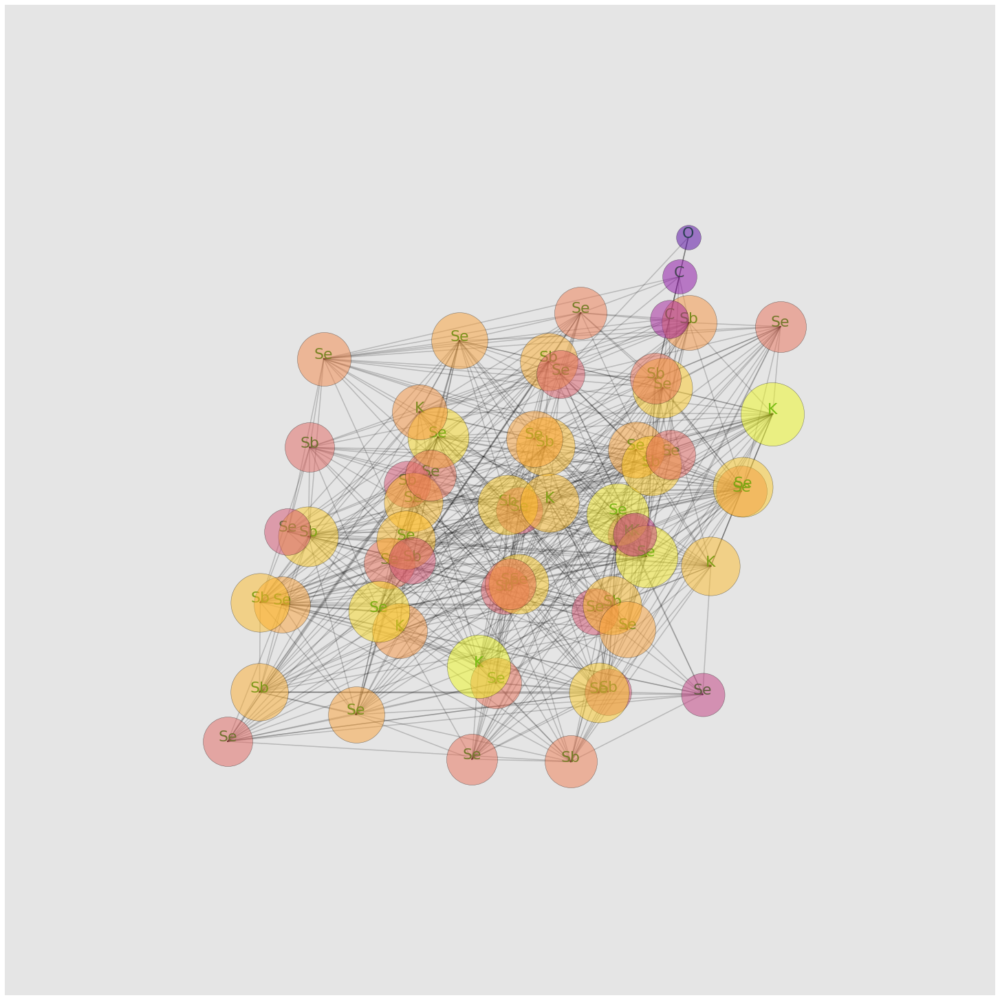

59

In [8]:
#for i, ang in enumerate(range(0,361,2)):
#    util_funcs.network_plot_3D(net_g, i, save=True, hide_axis= True, name=str(i))
util_funcs.network_plot_3D(net_g, 270, save=False, hide_axis= True)

In [13]:
import glob
from PIL import Image

In [14]:
#creating GIF
fp_in = os.getcwd() + "/graph_img/az/*.png"
fp_out = "C:/Users/Harshit/PycharmProjects/S2EF/graph_img/az/image.gif"

# https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
imgs = (Image.open(f) for f in sorted(glob.glob(fp_in)))
img = next(imgs)  # extract first image from iterator
img.save(fp=fp_out, format='GIF', append_images=imgs,
         save_all=True, duration=200, loop=0)

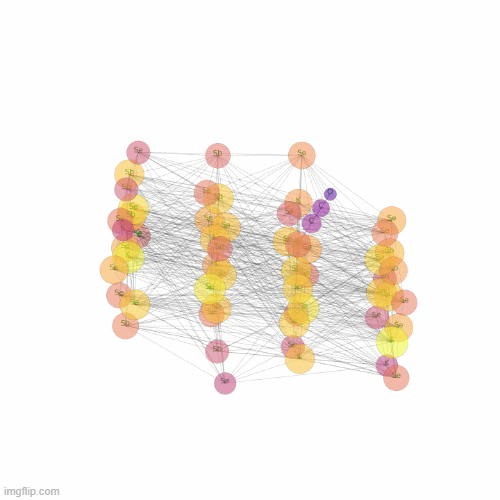

In [16]:
from IPython.display import Image
Image(open( os.getcwd()+"/graph_img/az/image_1.gif",'rb').read())
#Image(open( os.getcwd()+"/graph_img/az/image.gif",'rb').read())